In [1]:
import pandas as pd
import numpy as np
from scipy.signal import correlate, savgol_filter
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('../human_adrenals.mplstyle')

def create_template(length=400, tau_slow=200, tau_fast=10, rise_time=50, linear_rise=10, amplitude=1):
    """
    Create a synthetic calcium transient template with a gradual rise.
    """
    t = np.arange(length)
    template = np.zeros(length)

    # Small Linear Rise
    template[:linear_rise] = np.linspace(0, 0.1*amplitude, linear_rise)

    # Fast exponential rise
    exp_rise = (1 - np.exp(-(t[linear_rise:rise_time]-t[linear_rise]) / tau_fast))
    template[linear_rise:rise_time] = 0.1*amplitude + 0.9*amplitude*exp_rise

    # Slow Exponential Decay
    template[rise_time:] = np.exp(-(t[rise_time:] - rise_time) / tau_slow)
    return template

def extract_template(signal, onset_idx, window_size):
    """Extract a template from a real transient"""
    if onset_idx + window_size > len(signal):
        return None
    template = signal[onset_idx:onset_idx+window_size]
    if np.std(template) == 0:
        return None
    return (template - np.mean(template)) / np.std(template)

def normalize_signal(signal, window_size=1000):
    """Normalize signal in a sliding window"""
    normalized = np.zeros_like(signal, dtype=float)
    for i in range(len(signal)):
        start = max(0, i - window_size//2)
        end = min(len(signal), i + window_size//2)
        window = signal[start:end]
        normalized[i] = (signal[i] - np.mean(window)) / np.std(window)
    return normalized

def find_matches(signal, template, threshold=0.2, min_distance=50):
    """Find template matches in signal"""
    correlation = correlate(signal, template, mode='valid')
    correlation = correlation / len(template)
    matches = []
    last_match = -min_distance
    for i in range(1, len(correlation)-1):
        if (correlation[i] > threshold and
            correlation[i] > correlation[i-1] and
            correlation[i] > correlation[i+1] and
            i - last_match >= min_distance):
            matches.append(i)
            last_match = i
    return matches, correlation

def calculate_fwhm_function(signal, hysteresis=0.01):
    """Calculate Full Width at Half Maximum (FWHM) of a signal with Hysteresis"""
    half_max = (np.max(signal) - np.min(signal)) / 2.0
    half_max_level = np.min(signal) + half_max
    above_half_max = signal >= (half_max_level + hysteresis)
    crossings = np.diff(above_half_max.astype(int))
    rising_idx = np.where(crossings == 1)[0]
    falling_idx = np.where(crossings == -1)[0]
    if len(rising_idx) == 0 or len(falling_idx) == 0:
        return None, None, None
    rising_idx = rising_idx[0]
    falling_idx = falling_idx[-1]
    return rising_idx, falling_idx, half_max_level

def calculate_rise_decay_time(signal, onset_idx, peak_idx, perc_rise_low=0.1, perc_rise_high=0.9, perc_decay_low=0.9, perc_decay_high=0.1):
    """Calculate the time to rise from perc_rise to peak, and decay from peak to perc_decay"""

    #Rise Time
    baseline = signal[onset_idx]
    peak_val = signal[peak_idx]
    rise_start_val_low = baseline + perc_rise_low*(peak_val - baseline)
    rise_start_val_high = baseline + perc_rise_high*(peak_val - baseline)

    #Search before the peak
    rise_start_idx_low = None
    for i in range(peak_idx, onset_idx, -1):
        if signal[i] <= rise_start_val_low:
            rise_start_idx_low = i
            break
    if rise_start_idx_low is None:
        rise_start_idx_low = onset_idx  #Could not find.

    rise_start_idx_high = None
    for i in range(peak_idx, onset_idx, -1):
        if signal[i] <= rise_start_val_high:
            rise_start_idx_high = i
            break
    if rise_start_idx_high is None:
        rise_start_idx_high = onset_idx  #Could not find.

    #Decay Time:
    decay_end_val_low = peak_val + perc_decay_low*(baseline - peak_val)
    decay_end_val_high = peak_val + perc_decay_high*(baseline - peak_val)

    decay_end_idx_low = None
    for i in range(peak_idx, len(signal)):
        if signal[i] <= decay_end_val_low:
            decay_end_idx_low = i
            break
    if decay_end_idx_low is None:
        decay_end_idx_low = len(signal) - 1

    decay_end_idx_high = None
    for i in range(peak_idx, len(signal)):
        if signal[i] <= decay_end_val_high:
            decay_end_idx_high = i
            break
    if decay_end_idx_high is None:
        decay_end_idx_high = len(signal) - 1

    return rise_start_idx_low, rise_start_idx_high, decay_end_idx_low, decay_end_idx_high

def analyze_calcium_signals(data_file, template=None, threshold=0.7, min_distance=50,
                            calculate_fwhm=False,  savgol_params=(11,2), correlation_mode='valid'):
    """Analyze calcium signals using pattern matching"""
    if isinstance(data_file, str):
        try:
            df = pd.read_csv(data_file, index_col=0)
        except FileNotFoundError:
            raise FileNotFoundError(f"The data file '{data_file}' was not found.")
        except pd.errors.EmptyDataError:
            raise ValueError(f"The data file '{data_file}' is empty.")
    else:
        if not isinstance(data_file, pd.DataFrame):
            raise TypeError("data_file must be a string (file path) or a pandas DataFrame.")
        df = data_file.copy()

    numeric_cols = df.select_dtypes(include=[np.number]).columns
    signals = df[numeric_cols]

    # Create template if not provided
    if template is None:
        template = create_template()*3

    results = {}

    for column in signals.columns:
        # Get raw signal
        raw_signal = signals[column].values

        # Smooth and normalize signal
        smoothed = savgol_filter(raw_signal, savgol_params[0], savgol_params[1])
        normalized = normalize_signal(smoothed)

        # Find matches
        correlation = correlate(normalized, template, mode=correlation_mode) # Template Matching Mode
        correlation = correlation / len(template)
        matches = []
        last_match = -min_distance
        for i in range(1, len(correlation)-1):
            if (correlation[i] > threshold and
                correlation[i] > correlation[i-1] and
                correlation[i] > correlation[i+1] and
                i - last_match >= min_distance):
                matches.append(i)
                last_match = i

        # Analyze each match
        transients = []
        for onset in matches:
            # Define analysis window
            window_end = min(onset + len(template), len(smoothed))
            transient_region = smoothed[onset:window_end]

            # Find peak
            peak_idx = onset + np.argmax(transient_region[:min(100, len(transient_region))])

            # Store information
            transient_info = {
                'onset_frame': onset,
                'peak_frame': peak_idx,
                'correlation': correlation[onset],
                'amplitude': smoothed[peak_idx] - smoothed[onset]
            }

            if calculate_fwhm:
                rising_idx, falling_idx, half_max_level = calculate_fwhm_function(transient_region)
                if rising_idx is not None and falling_idx is not None and half_max_level is not None:  #Add check for half_max_level
                    transient_info['fwhm_start'] = onset + rising_idx
                    transient_info['fwhm_end'] = onset + falling_idx
                    transient_info['fwhm'] = transient_info['fwhm_end']-transient_info['fwhm_start']
                    transient_info['half_max_level'] = half_max_level
                else:
                    transient_info['fwhm_start'] = None
                    transient_info['fwhm_end'] = None
                    transient_info['half_max_level'] = None

            #Calculate Rise and decay Time
            rise_start_idx_low, rise_start_idx_high, decay_end_idx_low, decay_end_idx_high = calculate_rise_decay_time(transient_region, onset_idx=0, peak_idx=peak_idx-onset, perc_rise_low =0.1, perc_rise_high=0.9, perc_decay_low=0.9, perc_decay_high=0.1)
            transient_info['rise_start_idx_low'] = rise_start_idx_low
            transient_info['rise_start_idx_high'] = rise_start_idx_high
            transient_info['rise'] = transient_info['rise_start_idx_high'] - transient_info['rise_start_idx_low']
            transient_info['decay_end_idx_low'] = decay_end_idx_low
            transient_info['decay_end_idx_high'] = decay_end_idx_high
            transient_info['decay'] = transient_info['decay_end_idx_high'] - transient_info['decay_end_idx_low']

            transients.append(transient_info)

        # Store results
        results[column] = {
            'raw_signal': raw_signal,
            'smoothed': smoothed,
            'normalized': normalized,
            'correlation': np.pad(correlation, (0, len(template)-1), mode='constant'),
            'threshold': np.ones_like(raw_signal) * threshold,
            'template': template,
            'transients': transients
        }

    return results

def create_average_template_from_transient_numbers(results, cell_name, transient_numbers, window_length=100):
    """
    Creates an average template from specified transient numbers.
    """
    if cell_name not in results:
        print(f"Error: Cell '{cell_name}' not found in results.")
        return None

    cell_data = results[cell_name]
    transients = cell_data['transients']

    if not transients:
        print(f"Error: No transients found for cell '{cell_name}'.")
        return None

    templates = []
    for transient_number in transient_numbers:
        if 1 <= transient_number <= len(transients):
            transient = transients[transient_number - 1] # Convert to 0-based indexing

            # Make sure the window doesn't go past the data:
            onset_idx = transient['onset_frame']
            if onset_idx + window_length <= len(cell_data['smoothed']):
                template = extract_template(cell_data['smoothed'], onset_idx, window_length)
                if template is not None:
                    templates.append(template)
            else:
                print(f"Warning: Transient {transient_number} for cell '{cell_name}' exceeds data boundaries. Skipping.")
        else:
            print(f"Warning: Invalid transient number {transient_number} for cell '{cell_name}'. Skipping.")

    if not templates:
        print(f"Error: No valid templates found for averaging. Check transient numbers and data boundaries.")
        return None

    # Stack templates and average
    stacked = np.stack(templates)
    return np.mean(stacked, axis=0)

def plot_analysis(results, cell_name, figsize=(12, 5), show_template=False):
  """Plot pattern matching analysis results"""
  cell_data = results[cell_name]
  
  fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=figsize, height_ratios=[2, 1, 1])

  # Plot signal and detections
  ax1.plot(cell_data['raw_signal'], 'k-', alpha=0.5, label='Raw Signal')
  ax1.plot(cell_data['smoothed'], 'b-', label='Smoothed')
  
  # Mark detections
  colors = plt.cm.rainbow(np.linspace(0, 1, len(cell_data['transients'])))
  for i, transient in enumerate(cell_data['transients']):
      # Highlight the transient region
      ax1.axvspan(transient['onset_frame'], transient['onset_frame'] + len(cell_data['template']),
                   facecolor=colors[i], alpha=0.15, label=f'Match {i+1}' if i == 0 else '')
      
      ax1.axvline(transient['onset_frame'], color=colors[i], linestyle=':', alpha=0.5)
      ax1.axvline(transient['peak_frame'], color=colors[i], linestyle='--', alpha=0.5)

      #Plot the points!
      if 'rise_start_idx_low' in transient and transient['rise_start_idx_low'] is not None and 'rise_start_idx_high' in transient and transient['rise_start_idx_high' ] is not None:
        rise_start_idx_low = transient['rise_start_idx_low'] + transient['onset_frame']
        rise_start_idx_high = transient['rise_start_idx_high'] + transient['onset_frame']
        peak_idx = transient['peak_frame']

        decay_end_idx_low = transient['decay_end_idx_low'] + transient['onset_frame']
        decay_end_idx_high = transient['decay_end_idx_high'] + transient['onset_frame']

        #Plot 10% and 90% point for rise
        ax1.plot(rise_start_idx_low, cell_data['smoothed'][rise_start_idx_low], marker='o', color=colors[i], markersize=5, label='10% Rise' if i == 0 else '')
        ax1.plot(rise_start_idx_high, cell_data['smoothed'][rise_start_idx_high], marker='^', color=colors[i], markersize=5, label='90% Rise' if i == 0 else '')

        #Plot 90% and 10% points for decay
        ax1.plot(decay_end_idx_low, cell_data['smoothed'][decay_end_idx_low], marker='x', color=colors[i], markersize=5, label='90% Decay' if i == 0 else '')
        ax1.plot(decay_end_idx_high, cell_data['smoothed'][decay_end_idx_high], marker='s', color=colors[i], markersize=5, label='10% Decay' if i == 0 else '')

      # Plot FWHM line
      if 'fwhm_start' in transient and transient['fwhm_start'] is not None and transient['fwhm_end'] is not None and transient['half_max_level'] is not None:
          ax1.hlines(transient['half_max_level'], transient['fwhm_start'], transient['fwhm_end'],
                     color=colors[i], linewidth=2, label='FWHM' if i == 0 else '')
        
  ax1.set_title(f'Pattern Matching Analysis - {cell_name}\n' +
               f'Number of matches: {len(cell_data["transients"])}')
  ax1.set_ylabel('Fluorescence')
  #ax1.legend()
  ax1.grid(True, alpha=0.3)

  # Plot normalized signal
  ax2.plot(cell_data['normalized'], 'g-', label='Normalized Signal')
  ax2.set_ylabel('Normalized')
  ax2.legend()
  ax2.grid(True, alpha=0.3)

  # Plot correlation and threshold
  ax3.plot(cell_data['correlation'], 'r-', label='Correlation')
  ax3.plot(cell_data['threshold'], 'k--', label='Threshold')
  ax3.set_xlabel('Frame')
  ax3.set_ylabel('Correlation')
  ax3.legend()
  ax3.grid(True, alpha=0.3)

  if show_template:
    # Insert template as inset
    template_ax = fig.add_axes([0.05, 0.65, len(cell_data['template'])/len(cell_data['raw_signal']), 0.1])
    template_ax.plot(cell_data['template'], 'b-')
    template_ax.set_title('Template')

  plt.tight_layout()
  plt.show()

def print_match_summary(results, cell_name):
    """Print summary of template matches"""
    cell_data = results[cell_name]
    print(f"\nMatch Summary for {cell_name}:")
    print("-" * 50)
    for i, transient in enumerate(cell_data['transients']):
        print(f"\nMatch {i+1}:")
        print(f"Onset frame: {transient['onset_frame']}")
        print(f"Peak frame: {transient['peak_frame']}")
        print(f"Correlation: {transient['correlation']:.3f}")
        print(f"Amplitude: {transient['amplitude']:.1f}")
        if 'fwhm_start' in transient and transient['fwhm_start'] is not None and transient['fwhm_end'] is not None:
            print(f"FWHM Start: {transient['fwhm_start']}")
            print(f"FWHM End: {transient['fwhm_end']}")
            print(f"FWHM: {transient['fwhm']}")

        if 'rise_start_idx_low' in transient:
            print(f"10% of the rise Start {transient['rise_start_idx_low']}")
        if 'rise_start_idx_high' in transient:
            print(f"90% of the rise Start {transient['rise_start_idx_high']}")
        if 'decay_end_idx_low' in transient:
            print(f"90% of the decay End {transient['decay_end_idx_low']}")
        if 'decay_end_idx_high' in transient:
            print(f"10% of the decay End {transient['decay_end_idx_high']}")


In [2]:
average_transient = np.loadtxt("Fura-2_template.csv", delimiter=",")


recording_list = ["Slice01_Rec01_Fura-2_Ratio.csv",
                 "Slice01_Rec02_Fura-2_Ratio.csv"]


results = {x:{} for x in recording_list}
for recording in recording_list:

    # Basic usage with synthetic template
    results[recording]=analyze_calcium_signals(recording, 
                                threshold=.5,
                                min_distance=300,
                                template=average_transient,
                                calculate_fwhm=True,          
                                savgol_params=(48,2))



Slice01_Rec01_Fura-2_Ratio.csv


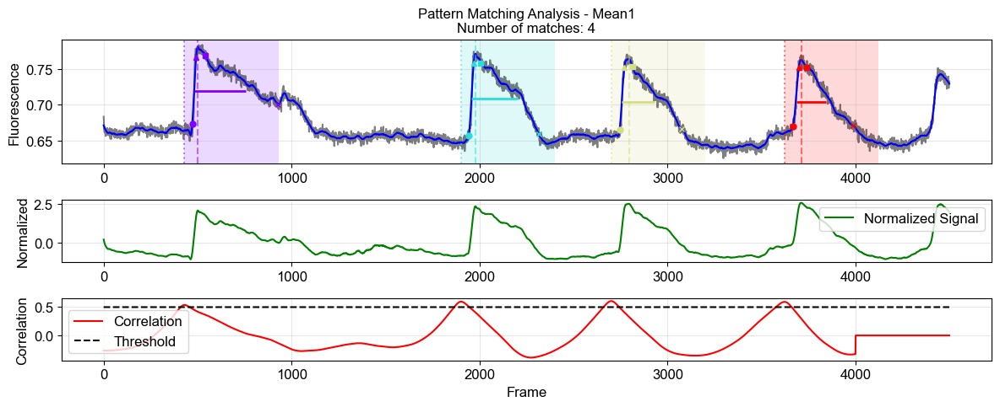

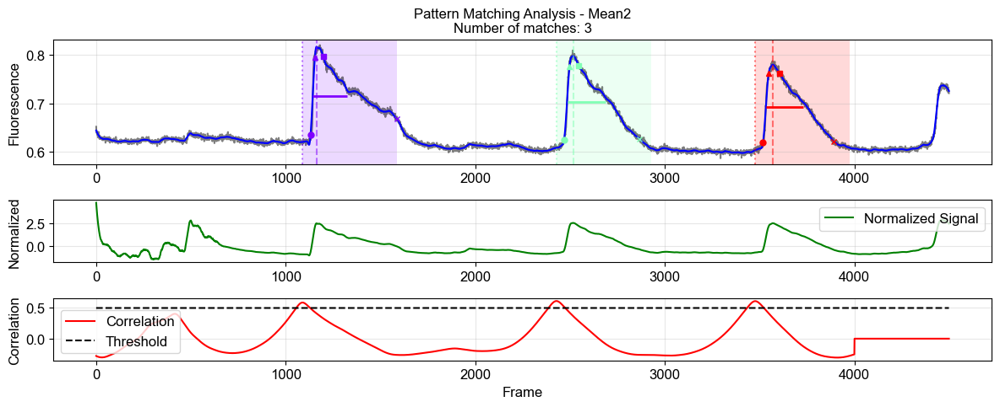

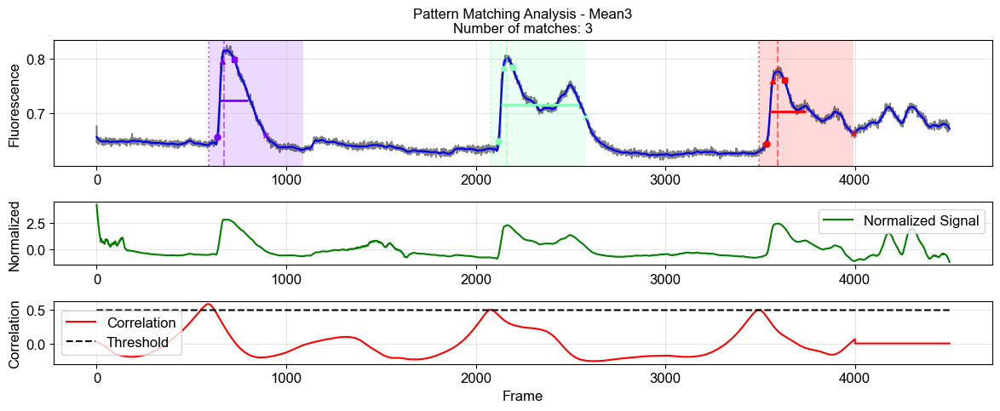

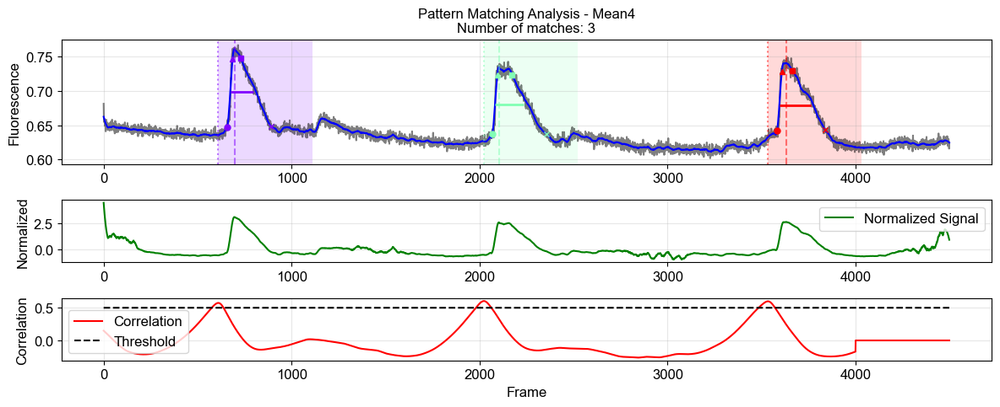

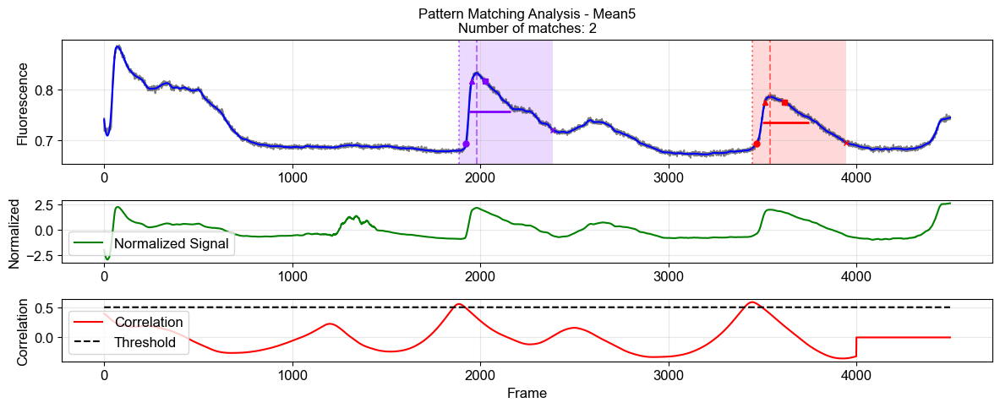

...

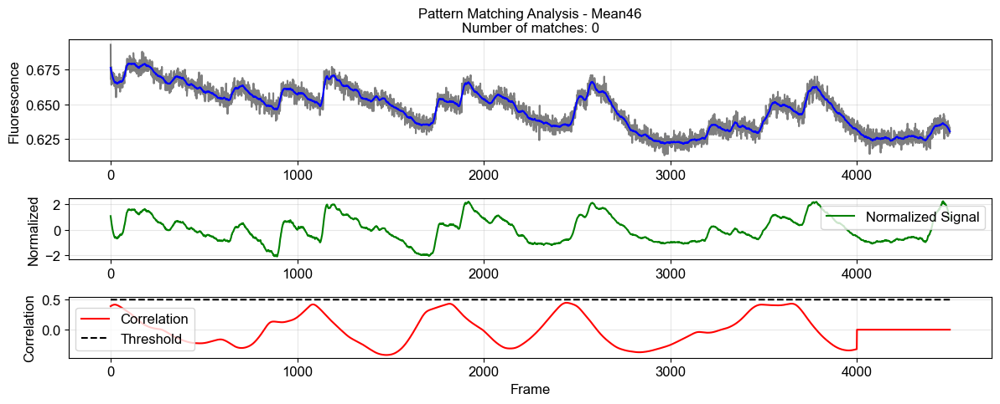

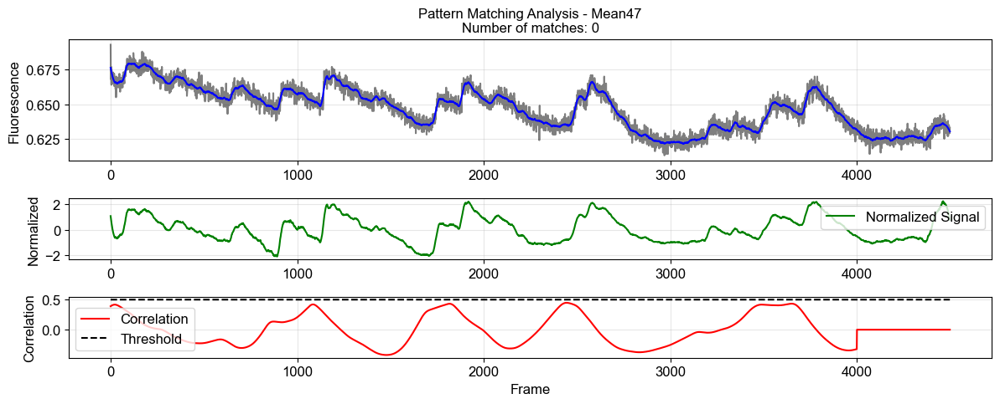

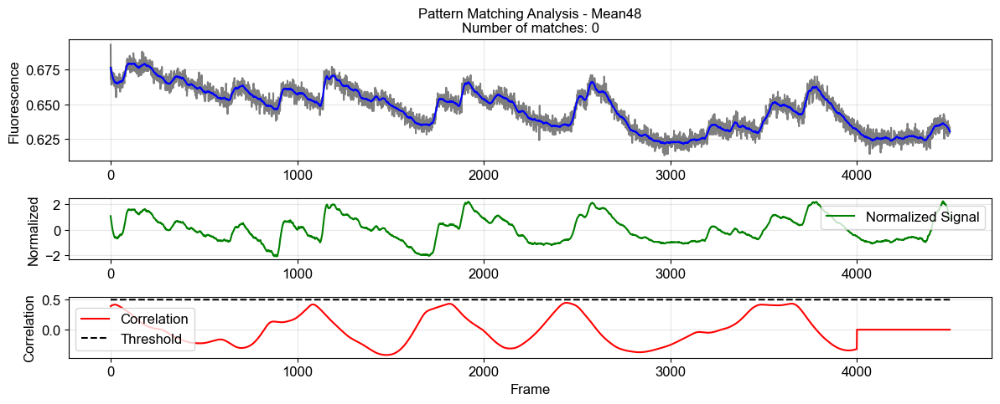

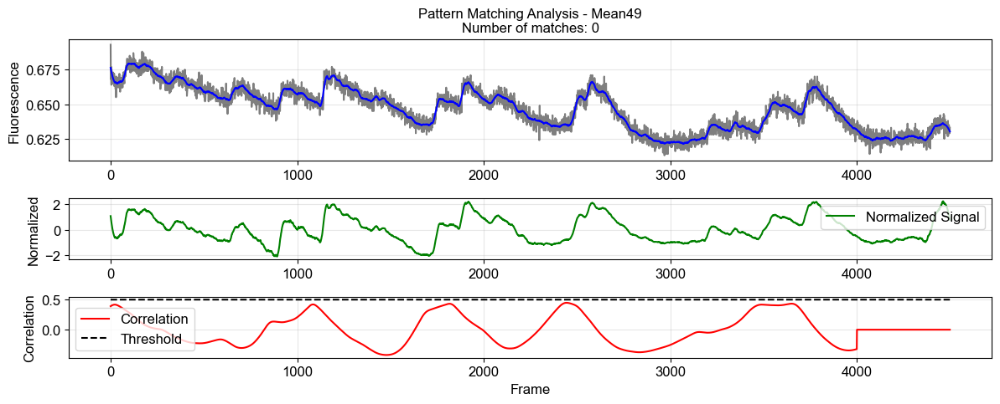

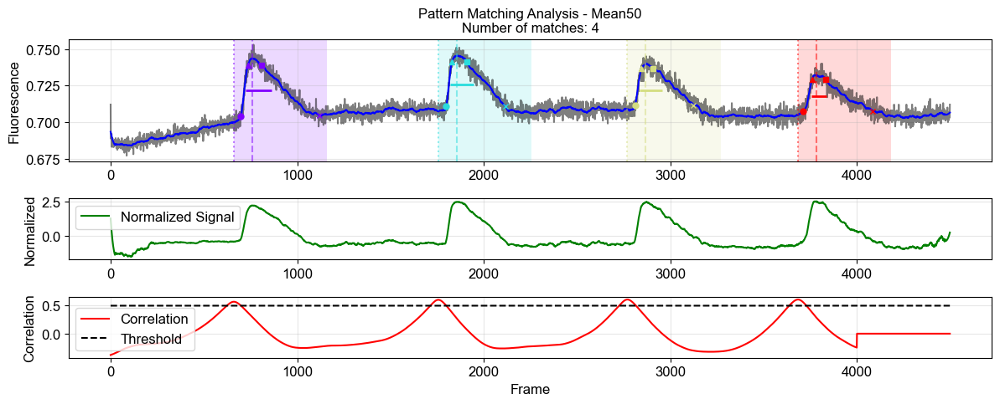

Slice01_Rec02_Fura-2_Ratio.csv


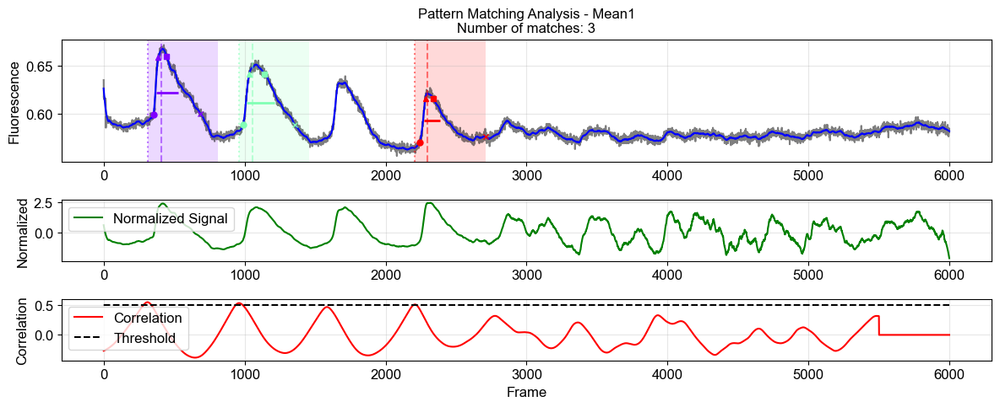

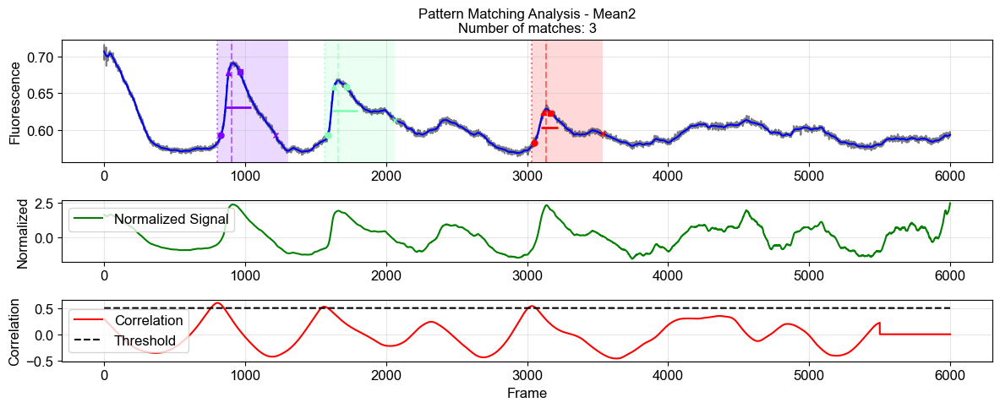

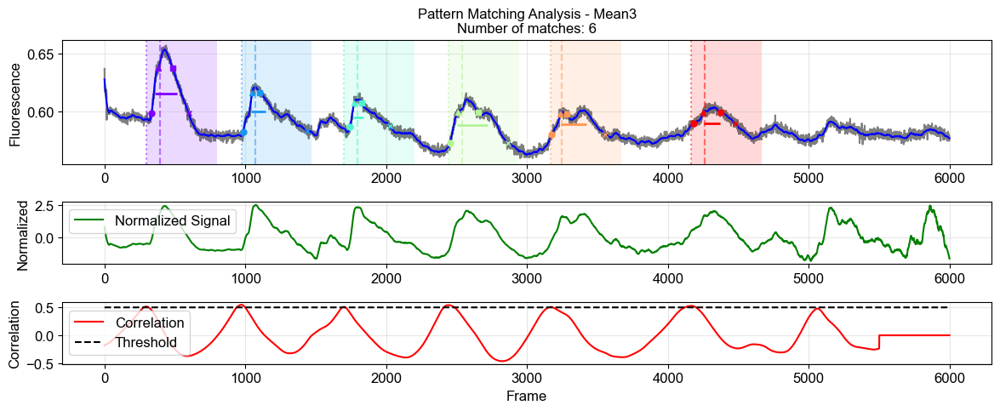

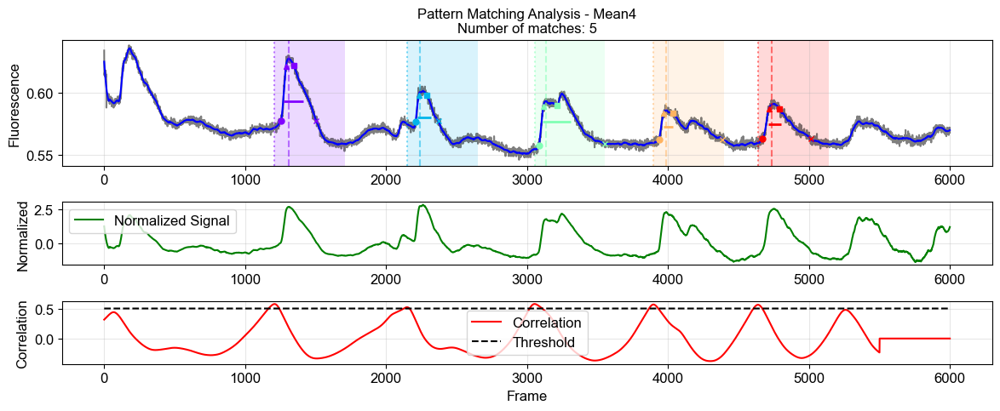

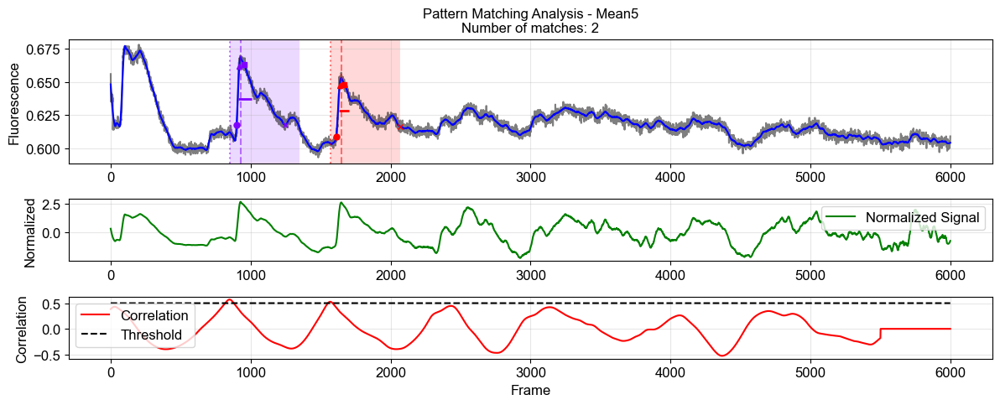

...

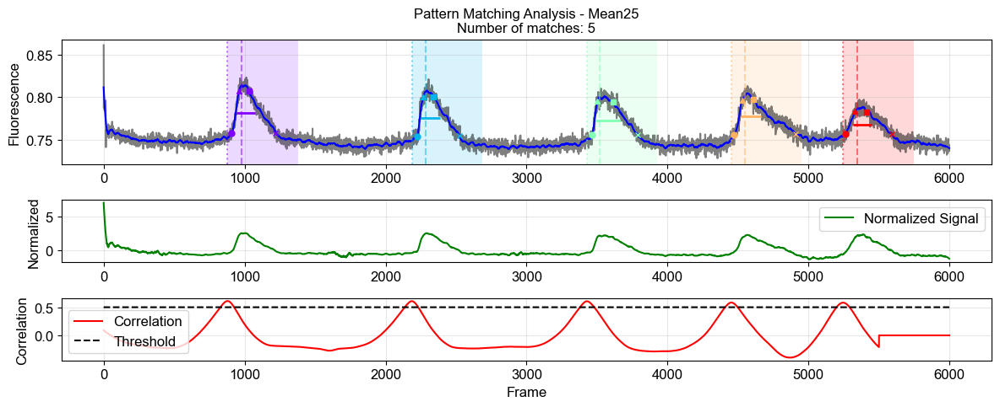

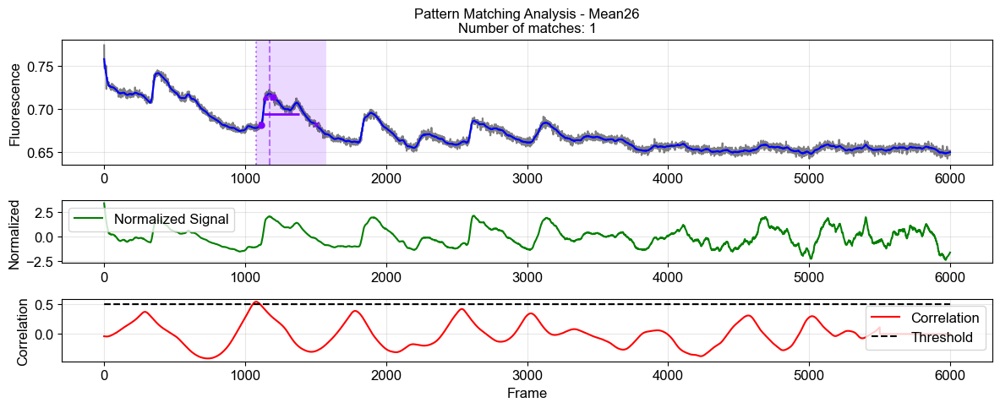

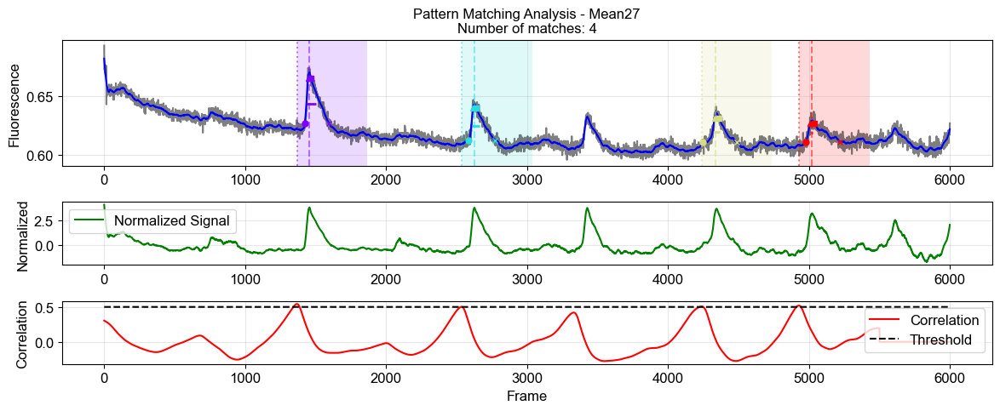

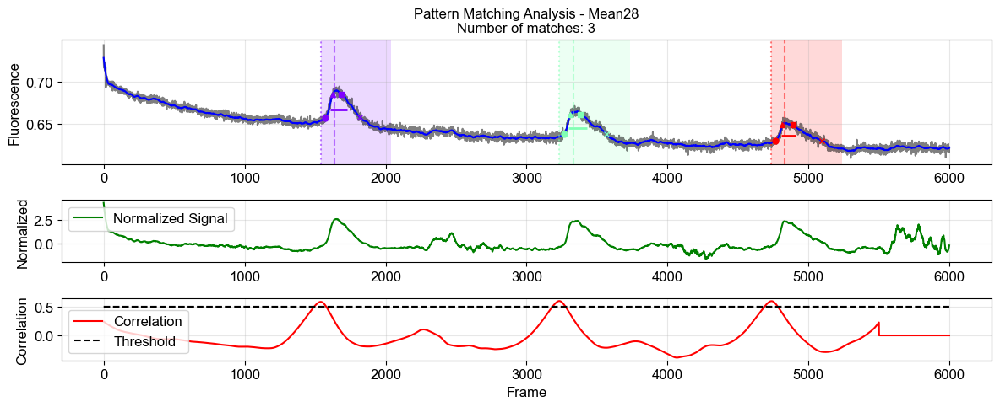

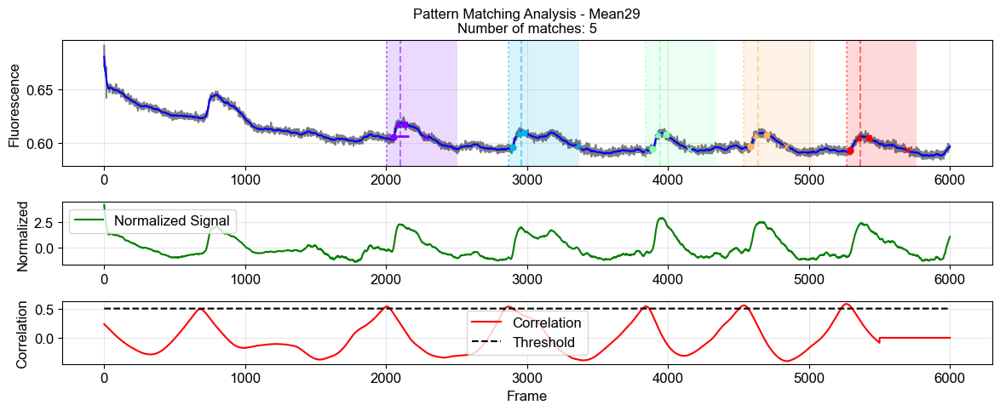

In [3]:
for recording in recording_list:
    print(recording)
    for cell in results[recording].keys():
        plot_analysis(results[recording], cell)

In [6]:
transients_df = pd.DataFrame([])
mean_transient = pd.DataFrame([])

for recording in results.keys():
    for cell in results[recording].keys():
        cell_info_df = pd.DataFrame(results[recording][cell]['transients'])
        if(len(cell_info_df)>0):
            cell_info_df["recording"] = recording
            cell_info_df["cell"] = cell
            cell_info_df["peak_interval"] = cell_info_df.peak_frame.diff()
        
            transients_df = pd.concat([transients_df, cell_info_df], 
                            axis=0)

transients_df = transients_df.reset_index()
transients_df.to_csv("Fura-2_transients.csv")

In [7]:
transients_df.describe()

,index,onset_frame,peak_frame,correlation,amplitude,fwhm_start,fwhm_end,fwhm,half_max_level,rise_start_idx_low,rise_start_idx_high,rise,decay_end_idx_low,decay_end_idx_high,decay,peak_interval
count,249.000000,249.000000,249.000000,249.000000,249.000000,239.000000,239.000000,239.000000,239.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,176.000000
mean,1.437751,2324.915663,2417.000000,0.564791,0.061924,2323.451883,2464.928870,141.476987,0.677939,38.281124,75.493976,37.212851,363.369478,139.301205,-224.068273,1031.403409
std,1.294039,1342.957178,1345.177138,0.033115,0.037784,1314.043748,1302.085841,60.058712,0.044010,11.882204,7.374280,14.190768,80.961212,27.431764,80.979334,346.095927
min,0.000000,178.000000,277.000000,0.500326,0.006852,230.000000,401.000000,14.000000,0.572940,4.000000,58.000000,17.000000,177.000000,90.000000,-401.000000,569.000000
25%,0.000000,1164.000000,1261.000000,0.537995,0.033493,1187.000000,1391.500000,104.000000,0.648518,31.000000,70.000000,26.000000,305.000000,120.000000,-279.000000,807.000000
50%,1.000000,2198.000000,2285.000000,0.568910,0.052648,2160.000000,2327.000000,139.000000,0.680556,40.000000,75.000000,32.000000,357.000000,134.000000,-215.000000,935.000000
75%,2.000000,3364.000000,3442.000000,0.593155,0.082340,3319.000000,3478.500000,178.500000,0.708718,47.000000,81.000000,45.000000,420.000000,155.000000,-161.000000,1171.500000
max,5.000000,5434.000000,5533.000000,0.617997,0.196241,5494.000000,5728.000000,405.000000,0.781306,65.000000,95.000000,87.000000,499.000000,217.000000,-76.000000,2901.000000
